# XAI - RISE


*To run this notebook on colab follow the steps in **README.md***

In [1]:
try:
    # Comment out if not using colab
    from google.colab import drive
    drive.mount('/content/drive')

    # Specific for luca's computer
    %cd "/content/drive/Othercomputers/Min MacBook Pro/INFO381-GitHub"
    using_colab = True
except:
    print("Not using Google Colab")
    using_colab = False

Mounted at /content/drive
/content/drive/Othercomputers/Min MacBook Pro/INFO381-GitHub


**To run code with CLIP, either have git install or run on Google Colab**

In [2]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-hhlq38t9
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-hhlq38t9
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 58.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import torch
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import models
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import torch.nn.functional as F
import clip
from skimage.transform import resize
from PIL import Image

# Local imports
import sys
import os

if using_colab:
    sys.path.append(os.path.abspath("helper_functions"))
else:
    sys.path.append(os.path.abspath("../helper_functions"))
from utils import get_dataloaders, cherry_pick_img_real, cherry_pick_img_ai_generated
from model_definitions import CLIPClassifier

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
train_loader, test_loader = get_dataloaders(batch_size=32, split = 'both')
print(test_loader)

Running in Google Colab


**Load CLIP preprocessing and CNN Transform**

In [ ]:
clip_model, preprocess_clip = clip.load("ViT-B/32", device=device)

cnn_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor()
])

**Load dataloaders with both transforms**

In [ ]:
cnn_model = models.resnet18(pretrained=False)
cnn_model.fc = nn.Linear(cnn_model.fc.in_features, 2)

if using_colab:
    cnn_model.load_state_dict(torch.load("models/resnet18_cnn.pth", map_location=device))
else:
    cnn_model.load_state_dict(torch.load("../models/resnet18_cnn.pth", map_location=device))

cnn_model.eval().to(device)
cnn_model.input_size = (512, 512)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [ ]:
clip_classifier = CLIPClassifier(clip_model, embed_dim=512, num_classes=2).to(device)

if using_colab:
    clip_classifier.load_state_dict(torch.load("models/clip_classifier_10epochs.pth", map_location=device))
else:
    clip_classifier.load_state_dict(torch.load("../models/clip_classifier_10epochs.pth", map_location=device))

clip_classifier.eval()

The RISE code is ispired from here:

*https://github.com/eclique/RISE/blob/master/explanations.py*

**Generating masks**

In [ ]:
def generate_masks(model, N, s, p1):
    cell_size = np.ceil(np.array(model.input_size) / s).astype(int)
    up_size = ((s + 1) * cell_size).astype(int)

    grid = np.random.rand(N, s, s) < p1
    grid = grid.astype('float32')

    masks = np.empty((N, *model.input_size))

    for i in tqdm(range(N), desc='Generating masks'):
        x = np.random.randint(0, cell_size[0])
        y = np.random.randint(0, cell_size[1])
        upsampled = resize(grid[i], up_size, order=1, mode='reflect', anti_aliasing=False)
        masks[i] = upsampled[x:x + model.input_size[0], y:y + model.input_size[1]]

    masks = masks.reshape(N, 1, *model.input_size)
    return masks


**Rise explainer**

In [ ]:
def explain(model, inp, masks, N, p1, batch_size=100):
    with torch.no_grad():
        inp_np = inp.cpu().numpy()  # (1, 3, H, W)
        inp_np = inp_np.squeeze(0)  # -> (3, H, W)
        masked = masks * inp_np  # (N, 1, H, W) * (3, H, W) → (N, 3, H, W)

        preds = []
        for i in tqdm(range(0, N, batch_size), desc='Explaining'):
            batch = torch.from_numpy(masked[i:i+batch_size]).to(device).float()
            out = model(batch)
            probs = torch.softmax(out, dim=1).cpu().numpy()
            preds.append(probs)

        preds = np.concatenate(preds, axis=0)
        sal = preds.T @ masks.reshape(N, -1)
        sal = sal.reshape(2, *model.input_size)  # 2 classes
        sal = sal / N / p1
    return sal


**Run RISE model**

In [ ]:
def run_rise_get_outputs(image_path, model, transform, class_names, N=2000, s=8, p1=0.5):
    # Load + preprocess image
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0)

    # Predict
    with torch.no_grad():
        output = model(input_tensor.to(device))
        probs = F.softmax(output, dim=1)
        pred_class = torch.argmax(probs, dim=1).item()
        pred_label = class_names[pred_class]

    # RISE saliency
    masks = generate_masks(model, N, s, p1)
    saliency = explain(model, input_tensor.to(device), masks, N, p1)

    # Also return image as numpy
    img_np = transform(img).permute(1, 2, 0).numpy()

    return {
        "img_np": img_np,
        "saliency": saliency[pred_class],
        "label": pred_label,
        "class_id": pred_class,
        "image_path": image_path
    }

**Visualization function**

In [ ]:
def visualize_side_by_side(original_img_np, cnn_result, clip_result, titles=None, filename="xai_output.png"):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Titles
    if titles is None:
        titles = ["Original Image", "CNN + RISE", "CLIP + RISE"]

    # Original
    axes[0].imshow(original_img_np)
    axes[0].set_title(titles[0], fontsize=13, fontweight="bold")
    axes[0].axis("off")

    # CNN
    axes[1].imshow(cnn_result["img_np"])
    axes[1].imshow(cnn_result["saliency"], cmap='jet', alpha=0.5)
    axes[1].set_title(f"{titles[1]}: {cnn_result['label'].upper()}", fontsize=13)
    axes[1].axis("off")

    # CLIP
    axes[2].imshow(clip_result["img_np"])
    axes[2].imshow(clip_result["saliency"], cmap='jet', alpha=0.5)
    axes[2].set_title(f"{titles[2]}: {clip_result['label'].upper()}", fontsize=13)
    axes[2].axis("off")

    save_path = os.path.join("gui_images/RISE/", filename)
    plt.savefig(save_path, bbox_inches="tight")

    plt.show()
    plt.close()

    print(f"Saved to: {save_path}")


**Defining class names**

In [ ]:
class_names = ['AI GENERATED', 'REAL']

### Explaining real images

In [ ]:
for i in range(1, 11):
    globals()[f"img_path_real_{i}"] = cherry_pick_img_real[i]

In [ ]:
cnn_results = []
clip_results = []

for i in range(1, 11):
    img_path = globals()[f"img_path_real_{i}"]

    cnn_result = run_rise_get_outputs(
        image_path=img_path,
        model=cnn_model,
        transform=cnn_transform,
        class_names=class_names
    )

    clip_result = run_rise_get_outputs(
        image_path=img_path,
        model=clip_classifier,
        transform=preprocess_clip,
        class_names=class_names
    )

    cnn_results.append(cnn_result)
    clip_results.append(clip_result)


Explaining: 100%|██████████| 20/20 [00:01<00:00, 15.69it/s]


### Explaining AI generated images

In [ ]:
for i in range(1, 11):
    globals()[f"img_path_ai_{i}"] = cherry_pick_img_ai_generated[i]

In [ ]:
cnn_results_ai = []
clip_results_ai = []

for i in range(1, 11):
    img_path_ai = globals()[f"img_path_ai_{i}"]

    cnn_result_ai = run_rise_get_outputs(
        image_path=img_path_ai,
        model=cnn_model,
        transform=cnn_transform,
        class_names=class_names
    )

    clip_result_ai = run_rise_get_outputs(
        image_path=img_path_ai,
        model=clip_classifier,
        transform=preprocess_clip,
        class_names=class_names
    )

    cnn_results_ai.append(cnn_result_ai)
    clip_results_ai.append(clip_result_ai)


Explaining: 100%|██████████| 20/20 [00:01<00:00, 15.75it/s]


### Visualize real images

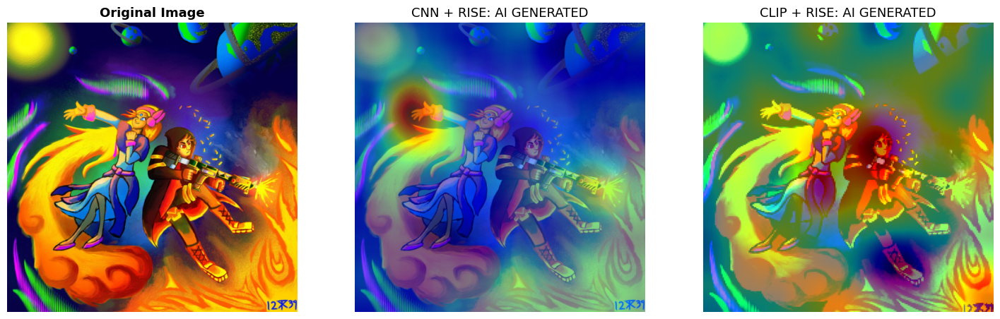

Saved to: gui_images/RISE/real/img1.png
[1] CNN predicts:  AI GENERATED (klasse 0)
[1] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result = cnn_results[0]
clip_result = clip_results[0]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img1.png"
)

print(f"[1] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[1] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")

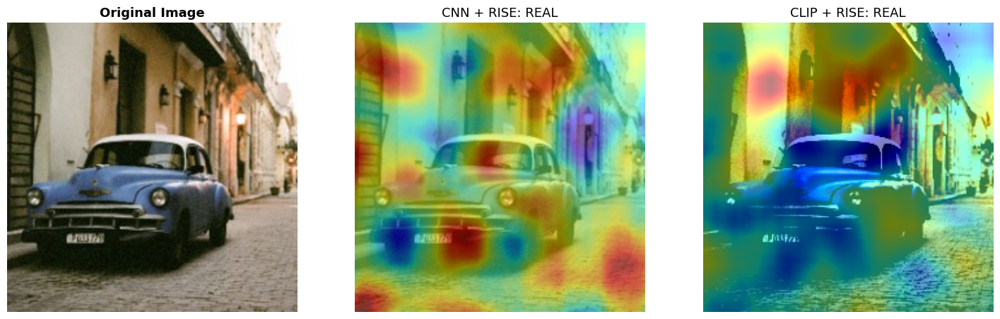

Saved to: gui_images/RISE/real/img2.png
[2] CNN predicts:  REAL (klasse 1)
[2] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result = cnn_results[1]
clip_result = clip_results[1]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img2.png"
)

print(f"[2] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[2] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")

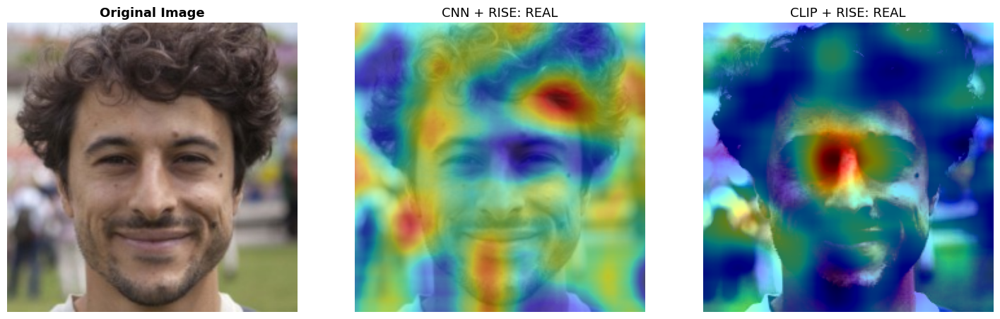

Saved to: gui_images/RISE/real/img3.png
[3] CNN predicts:  REAL (klasse 1)
[3] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result = cnn_results[2]
clip_result = clip_results[2]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img3.png"
)

print(f"[3] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[3] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")

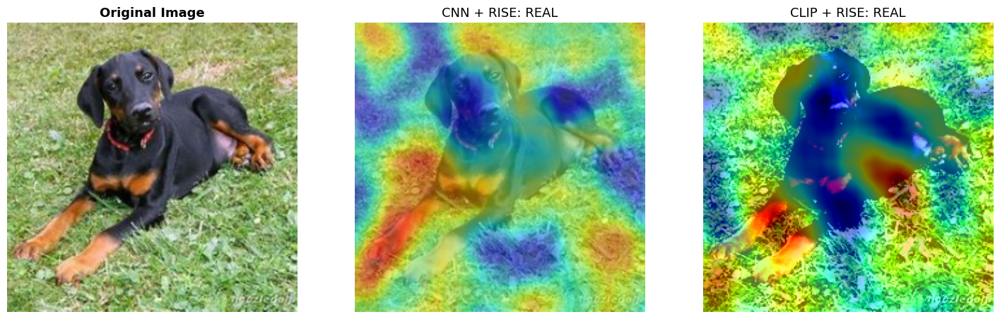

Saved to: gui_images/RISE/real/img4.png
[4] CNN predicts:  REAL (klasse 1)
[4] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result = cnn_results[3]
clip_result = clip_results[3]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img4.png"
)

print(f"[4] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[4] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")

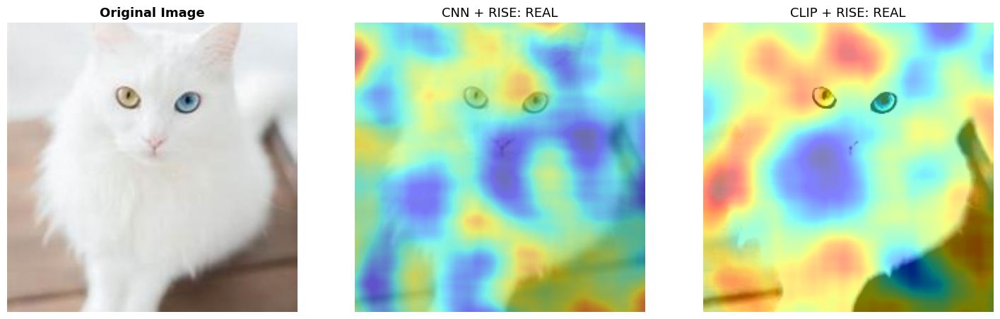

Saved to: gui_images/RISE/real/img5.png
[5] CNN predicts:  REAL (klasse 1)
[5] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result = cnn_results[4]
clip_result = clip_results[4]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img5.png"
)

print(f"[5] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[5] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")

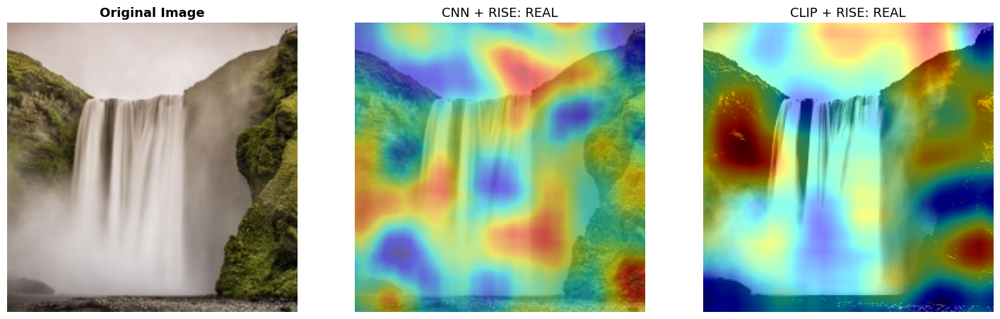

Saved to: gui_images/RISE/real/img6.png
[6] CNN predicts:  REAL (klasse 1)
[6] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result = cnn_results[5]
clip_result = clip_results[5]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img6.png"
)

print(f"[6] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[6] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")


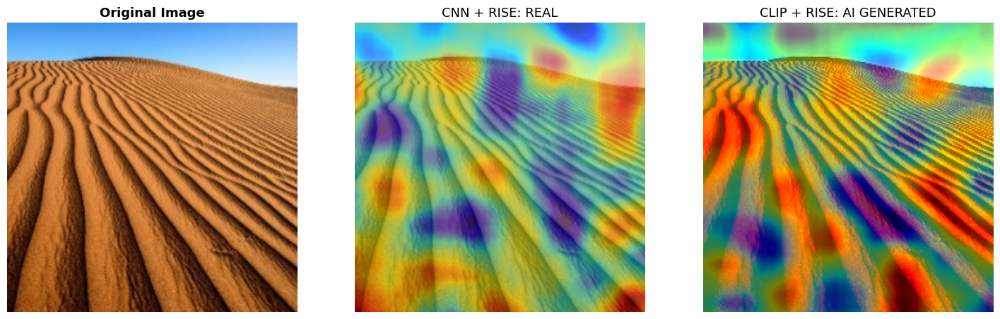

Saved to: gui_images/RISE/real/img7.png
[7] CNN predicts:  REAL (klasse 1)
[7] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result = cnn_results[6]
clip_result = clip_results[6]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img7.png"
)

print(f"[7] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[7] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")


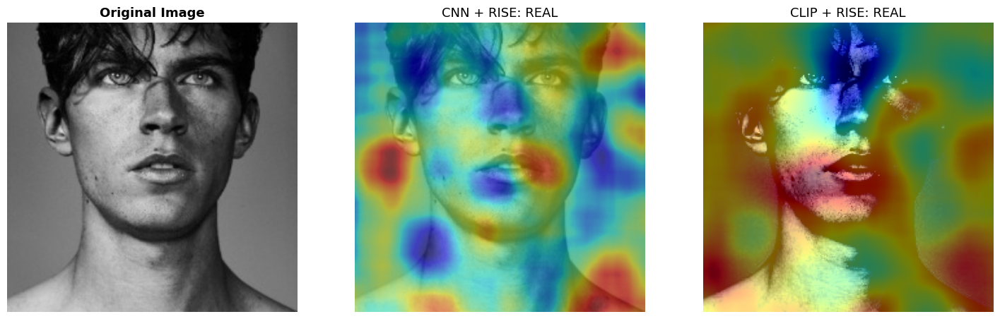

Saved to: gui_images/RISE/real/img8.png
[8] CNN predicts:  REAL (klasse 1)
[8] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result = cnn_results[7]
clip_result = clip_results[7]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img8.png"
)

print(f"[8] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[8] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")


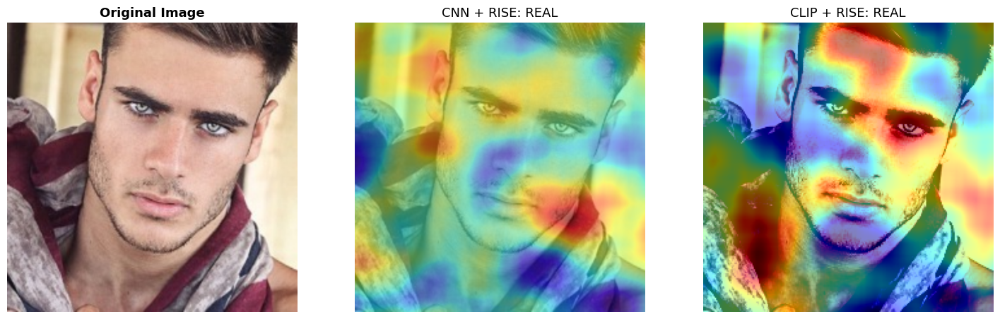

Saved to: gui_images/RISE/real/img9.png
[9] CNN predicts:  REAL (klasse 1)
[9] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result = cnn_results[8]
clip_result = clip_results[8]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img9.png"
)

print(f"[9] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[9] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")


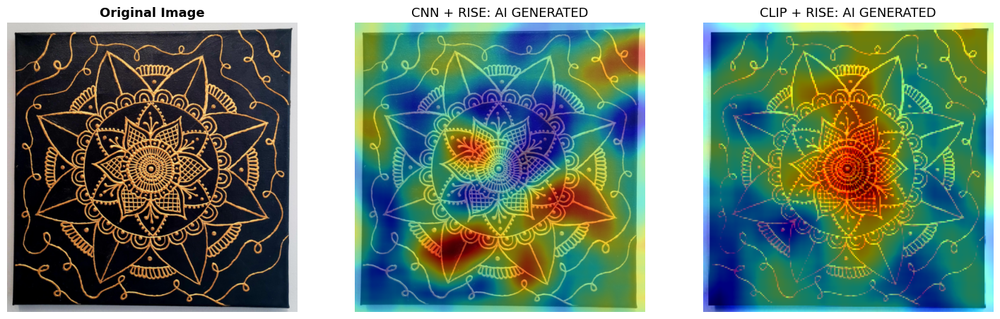

Saved to: gui_images/RISE/real/img10.png
[10] CNN predicts:  AI GENERATED (klasse 0)
[10] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result = cnn_results[9]
clip_result = clip_results[9]

visualize_side_by_side(
    original_img_np=cnn_result["img_np"],
    cnn_result=cnn_result,
    clip_result=clip_result,
    filename="real/img10.png"
)

print(f"[10] CNN predicts:  {cnn_result['label'].upper()} (klasse {cnn_result['class_id']})")
print(f"[10] CLIP predicts: {clip_result['label'].upper()} (klasse {clip_result['class_id']})")


### Visualize AI generated images

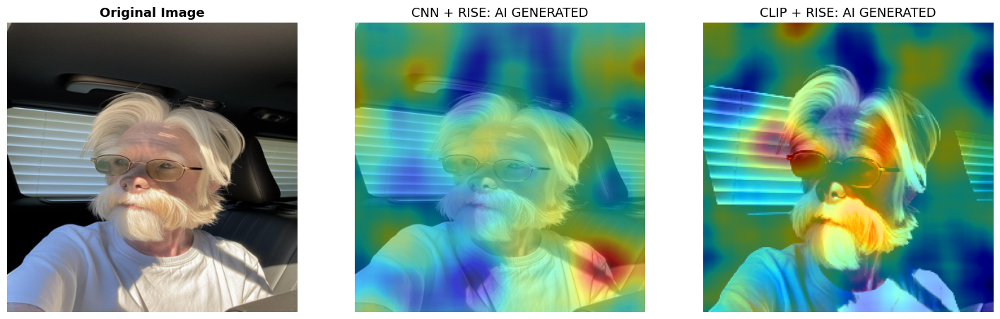

Saved to: gui_images/RISE/ai_generated/img1.png
[1] CNN predicts:  AI GENERATED (klasse 0)
[1] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result_ai = cnn_results_ai[0]
clip_result_ai = clip_results_ai[0]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img1.png"
)

print(f"[1] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[1] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")


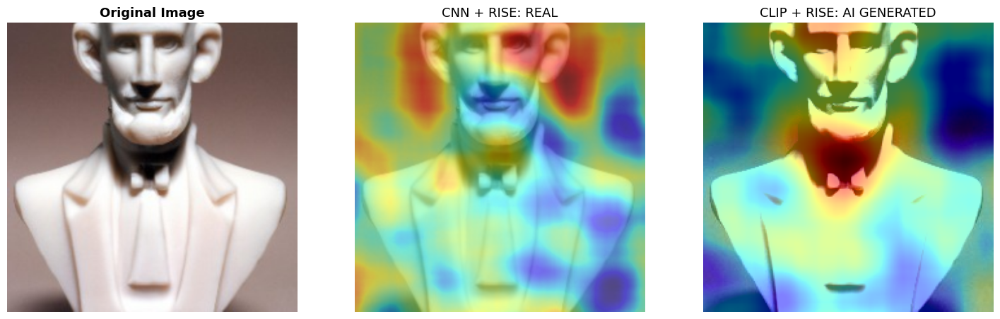

Saved to: gui_images/RISE/ai_generated/img2.png
[2] CNN predicts:  REAL (klasse 1)
[2] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result_ai = cnn_results_ai[1]
clip_result_ai = clip_results_ai[1]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img2.png"
)

print(f"[2] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[2] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")

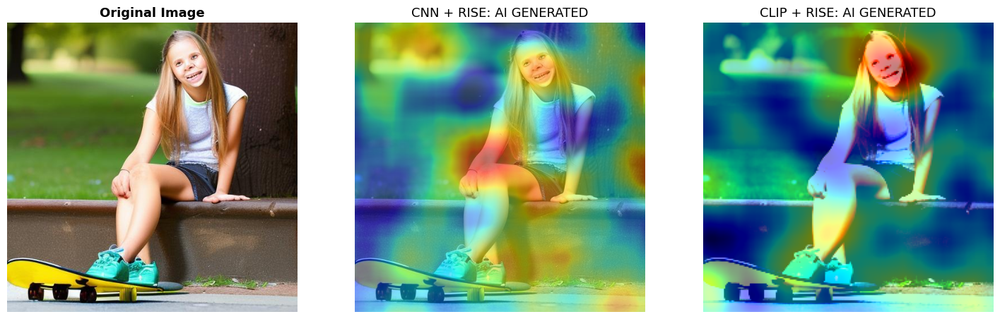

Saved to: gui_images/RISE/ai_generated/img3.png
[3] CNN predicts:  AI GENERATED (klasse 0)
[3] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result_ai = cnn_results_ai[2]
clip_result_ai = clip_results_ai[2]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img3.png"
)

print(f"[3] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[3] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")

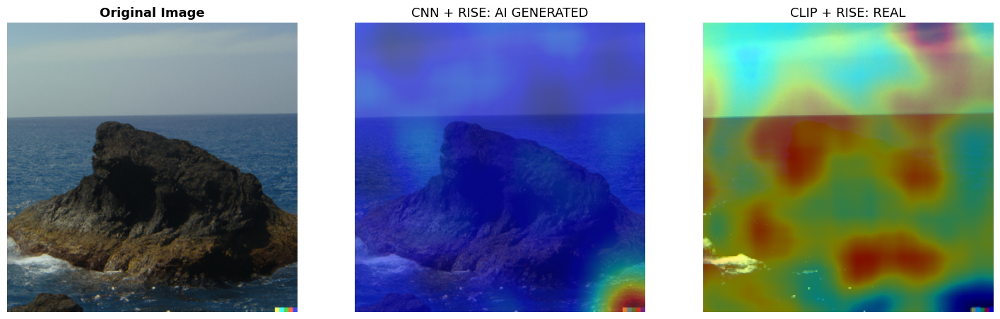

Saved to: gui_images/RISE/ai_generated/img4.png
[4] CNN predicts:  AI GENERATED (klasse 0)
[4] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result_ai = cnn_results_ai[3]
clip_result_ai = clip_results_ai[3]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img4.png"
)

print(f"[4] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[4] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")

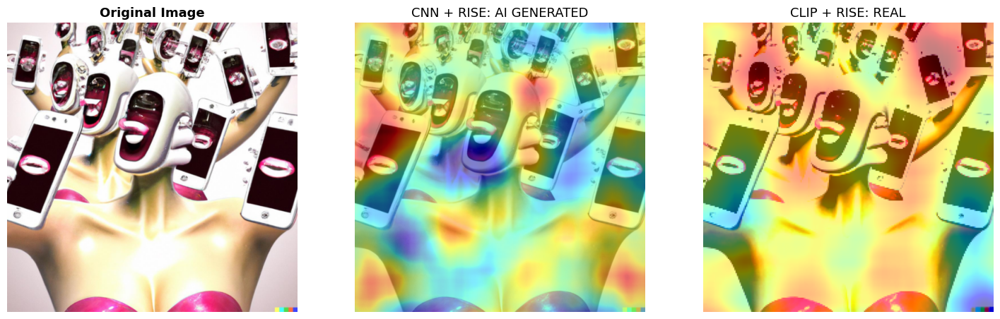

Saved to: gui_images/RISE/ai_generated/img5.png
[5] CNN predicts:  AI GENERATED (klasse 0)
[5] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result_ai = cnn_results_ai[4]
clip_result_ai = clip_results_ai[4]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img5.png"
)

print(f"[5] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[5] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")

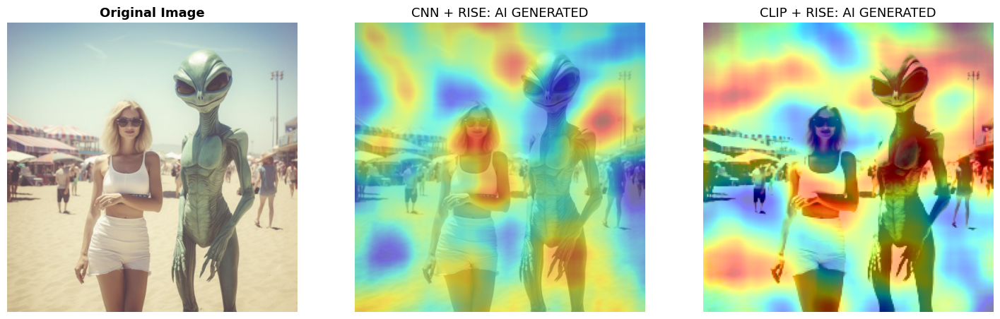

Saved to: gui_images/RISE/ai_generated/img6.png
[6] CNN predicts:  AI GENERATED (klasse 0)
[6] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result_ai = cnn_results_ai[5]
clip_result_ai = clip_results_ai[5]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img6.png"
)

print(f"[6] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[6] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")

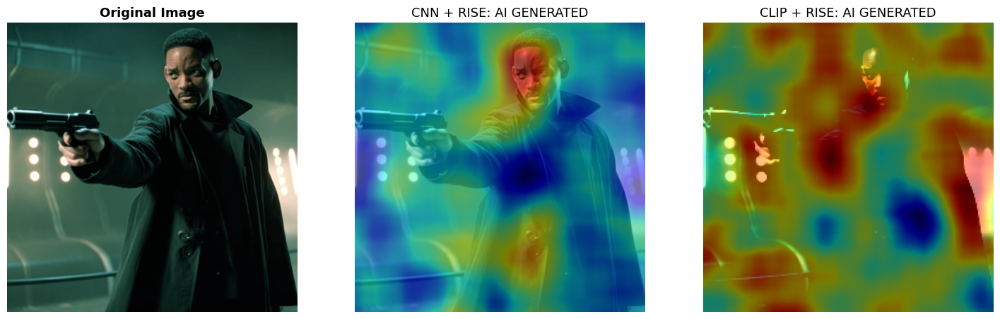

Saved to: gui_images/RISE/ai_generated/img7.png
[7] CNN predicts:  AI GENERATED (klasse 0)
[7] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result_ai = cnn_results_ai[6]
clip_result_ai = clip_results_ai[6]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img7.png"
)

print(f"[7] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[7] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")

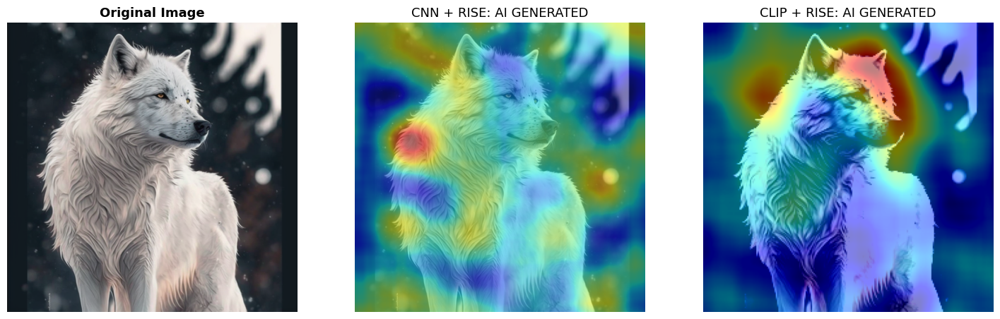

Saved to: gui_images/RISE/ai_generated/img8.png
[8] CNN predicts:  AI GENERATED (klasse 0)
[8] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result_ai = cnn_results_ai[7]
clip_result_ai = clip_results_ai[7]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img8.png"
)

print(f"[8] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[8] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")

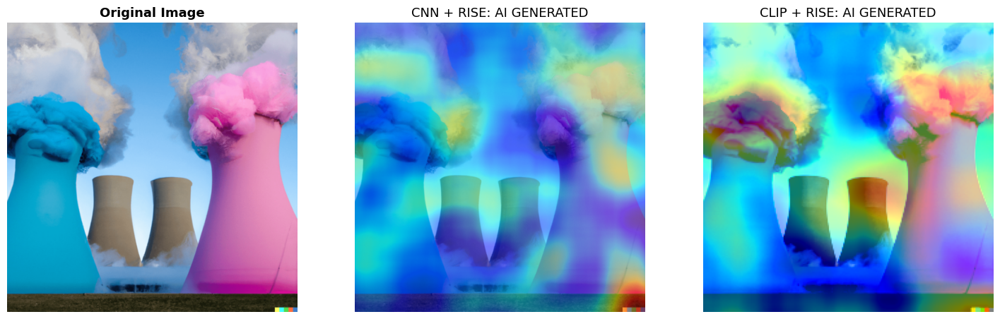

Saved to: gui_images/RISE/ai_generated/img9.png
[9] CNN predicts:  AI GENERATED (klasse 0)
[9] CLIP predicts: AI GENERATED (klasse 0)


In [ ]:
cnn_result_ai = cnn_results_ai[8]
clip_result_ai = clip_results_ai[8]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img9.png"
)

print(f"[9] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[9] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")

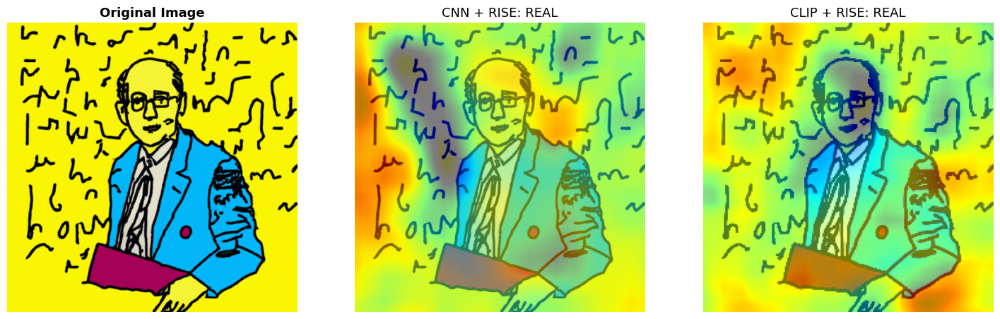

Saved to: gui_images/RISE/ai_generated/img10.png
[10] CNN predicts:  REAL (klasse 1)
[10] CLIP predicts: REAL (klasse 1)


In [ ]:
cnn_result_ai = cnn_results_ai[9]
clip_result_ai = clip_results_ai[9]

visualize_side_by_side(
    original_img_np=cnn_result_ai["img_np"],
    cnn_result=cnn_result_ai,
    clip_result=clip_result_ai,
    filename="ai_generated/img10.png"
)

print(f"[10] CNN predicts:  {cnn_result_ai['label'].upper()} (klasse {cnn_result_ai['class_id']})")
print(f"[10] CLIP predicts: {clip_result_ai['label'].upper()} (klasse {clip_result_ai['class_id']})")